# <h1><center>**Customer Segementation**</center></h1>

This project requires to develop a customer segmentation to define marketing strategy. The sample Dataset summarizes the usage behavior of about 9000 active credit card holders during the last 6 months. The file is at a customer level with 18 behavioral variables.

Dataset
[Link](https://drive.google.com/open?id=1P_jFdkc6FEai2W3RwcF5z5UIA60Our4Q)


Description:


**CUST_ID:** Identification of Credit Card holder (Categorical)

---
**BALANCE:** Balance amount left in their account to make purchases (BALANCE_FREQUENCY : How frequently the Balance is updated, score between 0 and 1 (1 = frequently updated, 0 = not frequently updated)

---

**PURCHASES:** Amount of purchases made from account

---

**ONEOFF_PURCHASES:** Maximum purchase amount done in one-go

---

 **INSTALLMENTS_PURCHASES:** Amount of purchase done in installment

 ---

 **CASH_ADVANCE:** Cash in advance given by the user

 ---

**PURCHASES_FREQUENCY:** How frequently the Purchases are being made, score between 0 and 1 (1 = frequently purchased, 0 = not frequently purchased)

---

**ONEOFFPURCHASESFREQUENCY:** How frequently Purchases are happening in one-go (1 = frequently purchased, 0 = not frequently purchased)

---

 **PURCHASESINSTALLMENTSFREQUENCY:** How frequently purchases in installments are being done (1 = frequently done, 0 = not frequently done)

 ---

**CASHADVANCEFREQUENCY:** How frequently the cash in advance being paid

---

**CASHADVANCETRX:** Number of Transactions made with "Cash in Advanced"



---


**PURCHASES_TRX:** Number of purchase transactions made

---

 **CREDIT_LIMIT:** Limit of Credit Card for user

 ---

**PAYMENTS:** Amount of Payment done by user

---

**MINIMUM_PAYMENTS**: Minimum amount of payments made by user

---

**PRCFULLPAYMENT:** Percent of full payment paid by user

---

**TENURE:** Tenure of credit card service for user

#Define the task

This project aims to develop a robust customer segmentation strategy for effective marketing, utilizing unsupervised learning partition models. We will evaluate and compare the performance of various clustering models to select the optimal model for our specific context and business needs.

###Import the libraries

In [1]:
# Core libraries

import pandas as pd
import numpy as np
import sweetviz as sv

import matplotlib.pyplot as plt
import plotly.graph_objs as go
import seaborn as sns

from sklearn.preprocessing import StandardScaler, normalize
from factor_analyzer import FactorAnalyzer
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity
from factor_analyzer.factor_analyzer import calculate_kmo
from sklearn.decomposition import PCA

from sklearn.cluster import KMeans
import scipy.cluster.hierarchy as shc
from sklearn.cluster import AgglomerativeClustering

from sklearn.metrics import silhouette_score

C:\Users\hayth\anaconda3\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def winsorize_column(data, column_name, lower_percentile=1, upper_percentile=99):
    '''
    Apply Winsorization to a specified column in a DataFrame.

    Winsorization involves capping extreme values by replacing them with the values at a specified lower and upper percentile.
    This technique helps mitigate the impact of outliers on statistical analyses and modeling, making the data more robust.
    '''
    lower_bound = np.percentile(data[column_name], lower_percentile)
    upper_bound = np.percentile(data[column_name], upper_percentile)

    data[column_name] = np.where(data[column_name] < lower_bound, lower_bound, data[column_name])
    data[column_name] = np.where(data[column_name] > upper_bound, upper_bound, data[column_name])

    return data


#Load the data
We will load our data.

In [3]:
# Load the data set
df = pd.read_csv("CC GENERAL.csv" )

#Data Inspection: Exploratory Analysis and Preprocessing

Take a quick look at the data to understand what you are dealing with.

In [4]:
# Inspect first few rows
print('*'*50)
print(df.shape)
print('*'*50)
df.head()

**************************************************
(8950, 18)
**************************************************


,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


Check we have sensible data types for each feature. E.g. we don't want any numeric features to be showing as object type.

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

Finding missing values

In [6]:
df.isnull().sum()

CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

Note : CREDIT_LIMIT and MINIMUM_PAYMENT content some null values . We will handling the missing values by replace it by means.

##Data cleaning

In [7]:
#drop the customer id
df.drop('CUST_ID', axis=1, inplace=True)
#replace missing values by means
df['CREDIT_LIMIT'].fillna(method='ffill', inplace=True)
df['MINIMUM_PAYMENTS'].interpolate(method='linear', axis=0 , inplace=True)

Confirm we have no nulls now:

In [8]:
# Check for nulls
df.isnull().sum()

BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

##Understand the data

Compute descriptive stats

Done! Use 'show' commands to display/save.   |██████████| [100%]   00:00 -> (00:00 left)



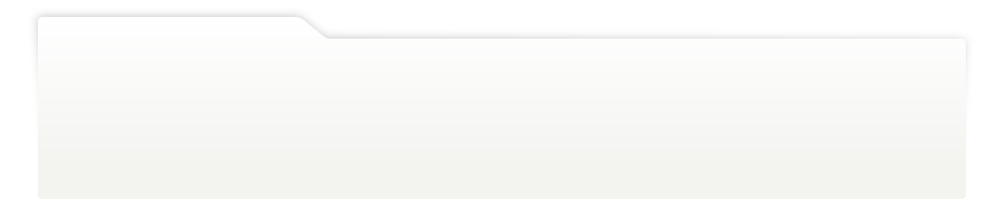
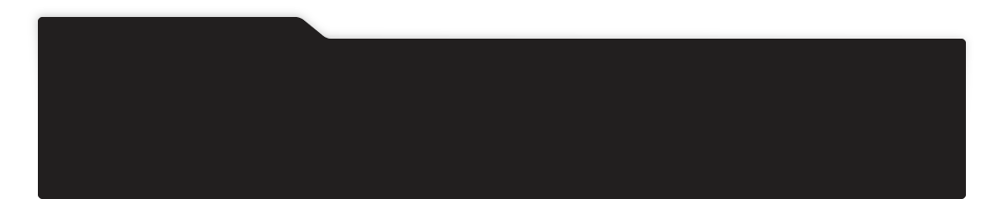
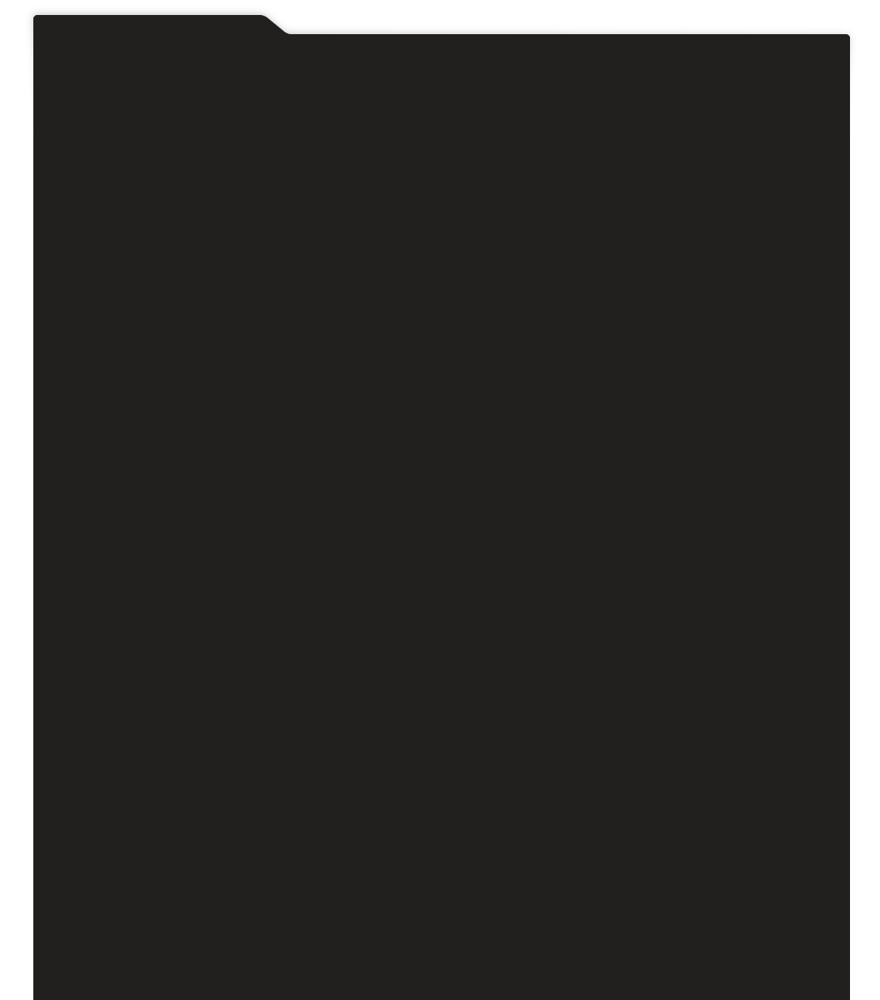
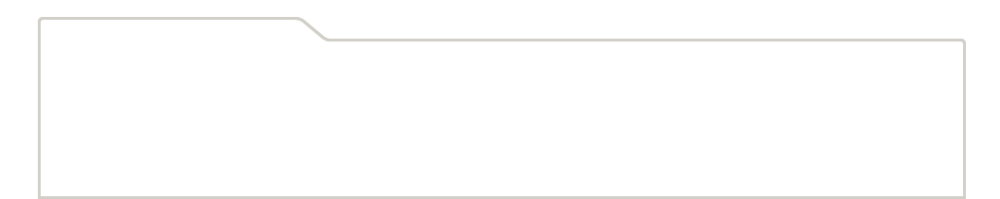
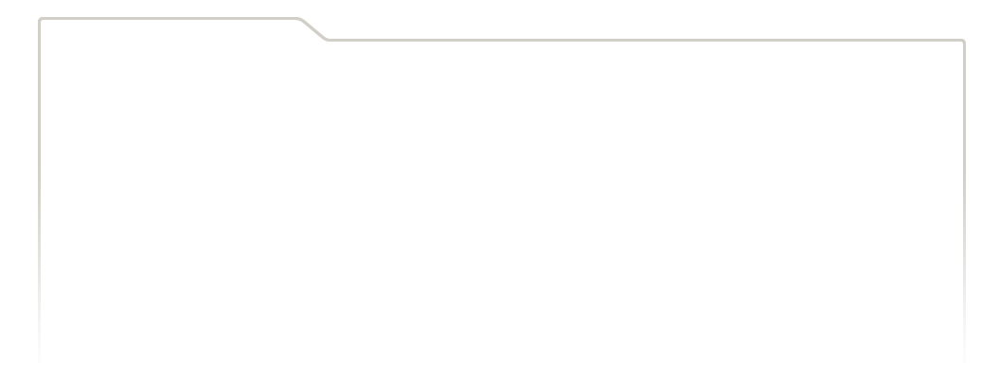
...
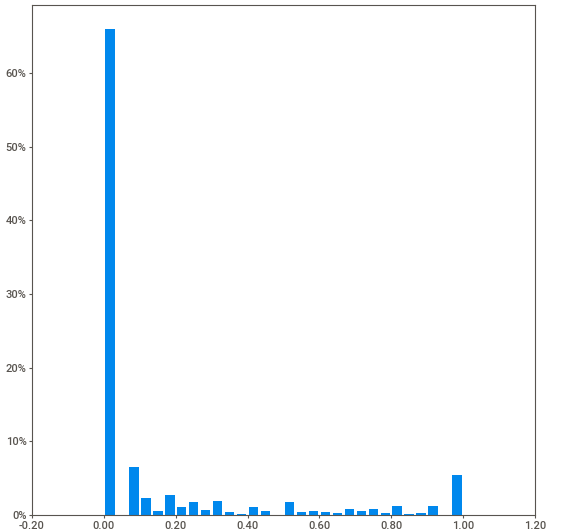
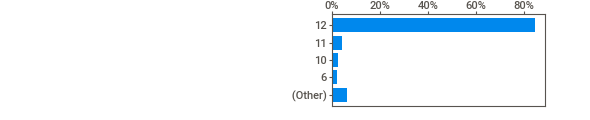
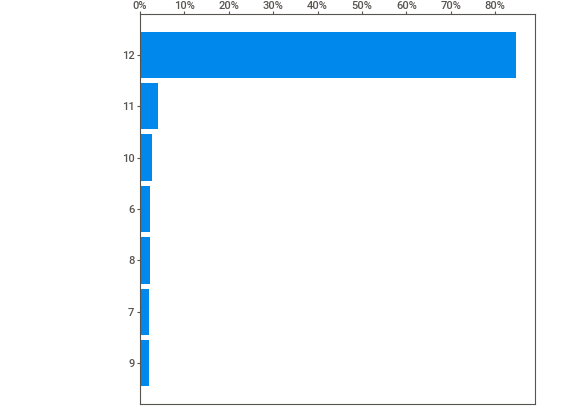
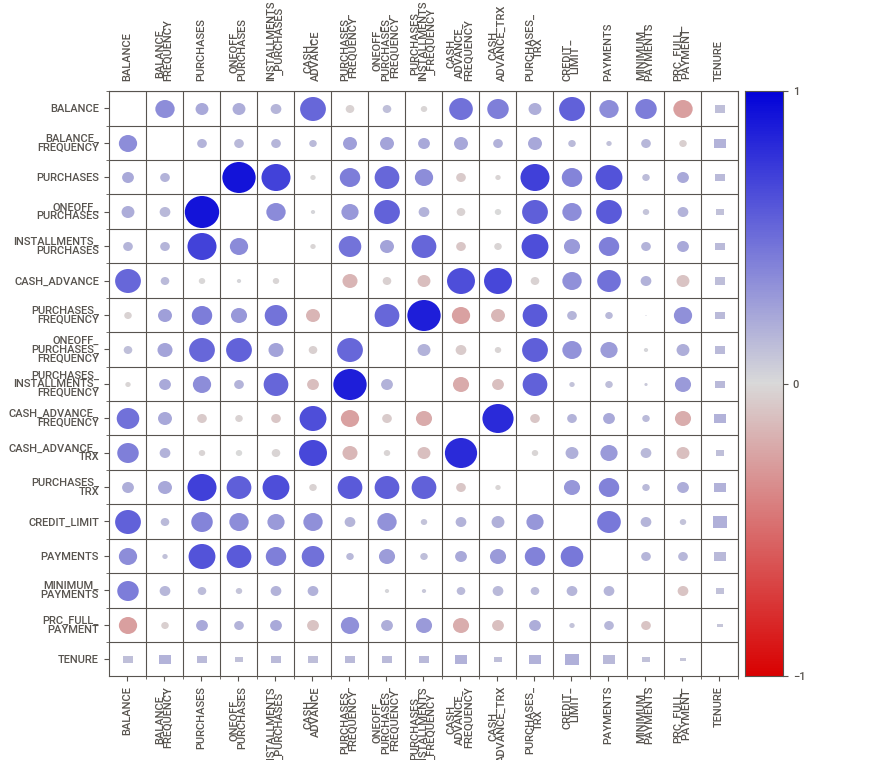
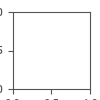

In [9]:
# Generate a report using Sweetviz
report = sv.analyze(df)

# Display the report in the notebook
report.show_notebook()

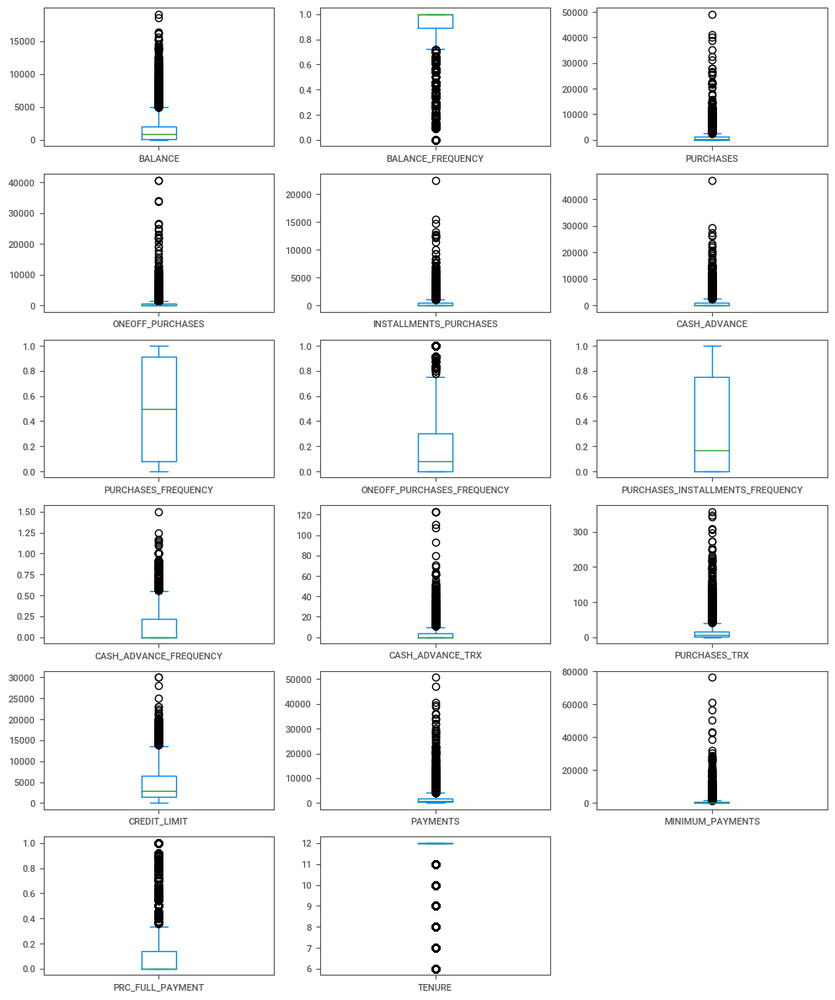

In [10]:
# Display boxplots for each numeric feature
df.plot(kind = 'box', subplots = True, figsize = (12, 20), layout=(8, 3))
plt.show()

Note : there are many outliers but we can't drop them because they may contain important information, so we treat the outliers as extreme values.

In [11]:
for column in df.columns:
  df = winsorize_column(df, column)

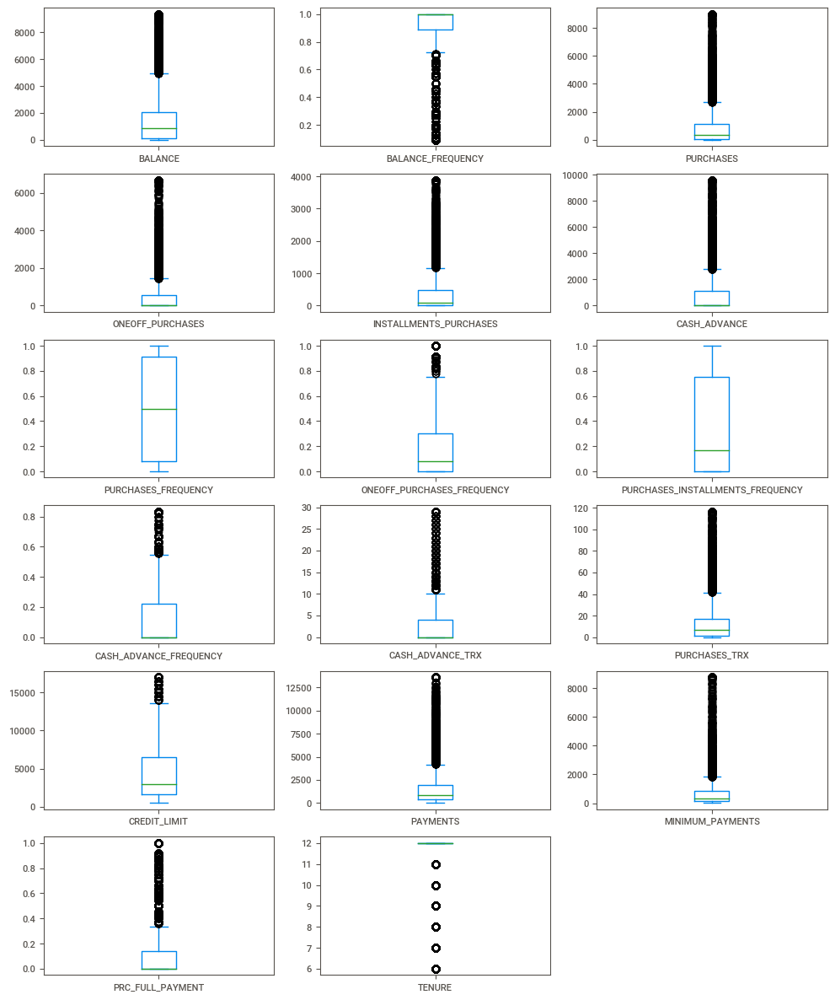

In [12]:
# Display boxplots for each numeric feature
df.plot(kind = 'box', subplots = True, figsize = (12, 20), layout=(8, 3))
plt.show()

#Data Preparation for Unsupervised Model Building

##Data Normalization

In [13]:
scaler = StandardScaler()
scaled_df = scaler.fit_transform(df)

# Normalizing the Data
normalized_df = normalize(scaled_df)

# Converting the numpy array into a pandas DataFrame
normalized_df = pd.DataFrame(normalized_df, columns= df.columns)

In [14]:
normalized_df.head(2)

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,-0.301426,-0.101140,-0.217845,-0.193266,-0.168922,-0.208264,-0.318667,-0.268158,-0.279479,-0.270809,-0.220286,-0.229061,-0.386615,-0.254046,-0.197116,-0.207660,0.142515
1,0.205787,0.032274,-0.149525,-0.119137,-0.138493,0.755410,-0.297587,-0.165304,-0.223355,0.144475,0.040600,-0.164443,0.173247,0.265433,0.058801,0.057051,0.087852


##Dimension reduction

Dimension reduction is a technique used to reduce the number of features in a dataset while retaining the maximum amount of information.

One of the commonly used techniques for dimensionality reduction is **Principal Component Analysis (PCA)**. The goal of PCA is to transform high-dimensional data into a lower-dimensional space that still contains most of the original information. By reducing the number of dimensions, we can visualize the data and gain insights into its underlying structure.

###PCA assumptions:
To ensure the reliability of the PCA results, it is important to check the assumptions, such as the normality of the data distribution and the suitability of the correlation matrix. Two commonly used criteria for evaluating the suitability of data for PCA are:

*   The chi-squared test (with a significance level of 0.05 or less)
*   The Kaiser-Meyer-Olkin (KMO) measure (greater than 0.6)

####**Chi-squared test **

In [15]:
chi_square_value,p_value=calculate_bartlett_sphericity(normalized_df) #adequacy
chi_square_value, p_value

(134685.973987414, 0.0)

####**Kaiser-Meyer-Olkin (KMO) **

In [16]:
kmo_all,kmo_model=calculate_kmo(normalized_df) #correlation
kmo_model

C:\Users\hayth\anaconda3\lib\site-packages\factor_analyzer\utils.py:244: UserWarning: The inverse of the variance-covariance matrix was calculated using the Moore-Penrose generalized matrix inversion, due to its determinant being at or very close to zero.
  warnings.warn(


0.6501532329886814

The results of the chi-squared test demonstrate a statistically significant outcome with a p-value of 0.0. This indicates that the data has been appropriately verified and the findings are reliable.

The Kaiser-Meyer-Olkin measure of sampling adequacy (KMO) was calculated to be 0.65, indicating that the data is significantly correlated and therefore suitable for further analysis.

Therefore, based on the verified assumptions and the statistical significance of the data, we are justified in proceeding with the application of Principal Component Analysis (PCA).

####PCA application

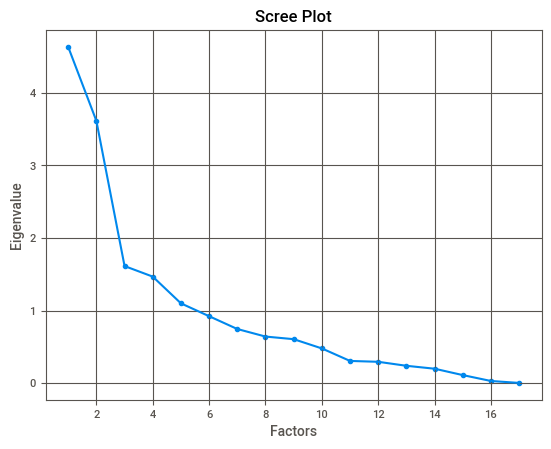

In [17]:
fa = FactorAnalyzer()
fa.fit(normalized_df)
# Check Eigenvalues
ev, v = fa.get_eigenvalues()
# Create scree plot using matplotlib
plt.scatter(range(1,normalized_df.shape[1]+1),ev)
plt.plot(range(1,normalized_df.shape[1]+1),ev)
plt.title('Scree Plot')
plt.xlabel('Factors')
plt.ylabel('Eigenvalue')
plt.grid()
plt.show()

The scree plot method involves plotting a line for each factor and its corresponding eigenvalue. In this method, only the eigenvalues greater than one are considered to be significant factors.

Upon examining the visualization, it is clear that only 5 factors have eigenvalues greater than one, indicating that we should choose only 5 factors or unobserved variables.

In [18]:
fa = FactorAnalyzer(n_factors=5)
fa.fit(normalized_df)
factor_df=pd.DataFrame(fa.loadings_,index=normalized_df.columns)
print(factor_df)

                                         0         1         2         3  \
BALANCE                          -0.082085 -0.085228  0.019745  0.840945   
BALANCE_FREQUENCY                 0.160103  0.105121  0.079420 -0.018793   
PURCHASES                         0.247999  0.679998 -0.057931  0.228219   
ONEOFF_PURCHASES                 -0.207488  0.999586 -0.030445  0.090957   
INSTALLMENTS_PURCHASES            0.737877 -0.081818 -0.051116  0.239218   
CASH_ADVANCE                     -0.068057 -0.131882  0.574440  0.401354   
PURCHASES_FREQUENCY               0.888805  0.132279 -0.014966 -0.181770   
ONEOFF_PURCHASES_FREQUENCY       -0.078680  0.877541  0.016698 -0.098671   
PURCHASES_INSTALLMENTS_FREQUENCY  1.130297 -0.326806 -0.000125 -0.077806   
CASH_ADVANCE_FREQUENCY           -0.046674  0.020593  0.908377 -0.008521   
CASH_ADVANCE_TRX                  0.012638  0.013209  0.913548  0.031058   
PURCHASES_TRX                     0.612756  0.409327  0.032478  0.040537   
CREDIT_LIMIT


<head>
    <title>Factor Analysis Interpretation</title>
</head>
<body>
    <h1>Interpretation of Factor Analysis Results</h1>
    <p><strong>Factor 0:</strong> This factor has relatively high loadings for variables like "PURCHASES_FREQUENCY," "PURCHASES_INSTALLMENTS_FREQUENCY," "CASH_ADVANCE_TRX," and "MINIMUM_PAYMENTS." These variables are positively associated with Factor 0.</p>
    <p><strong>Factor 1:</strong> This factor has high loadings for "BALANCE," "BALANCE_FREQUENCY," "PURCHASES," "ONEOFF_PURCHASES," and "CREDIT_LIMIT." These variables are positively associated with Factor 1.</p>
    <p><strong>Factor 2:</strong> This factor has high loadings for "CASH_ADVANCE," "PURCHASES_FREQUENCY," "ONEOFF_PURCHASES_FREQUENCY," and "CASH_ADVANCE_FREQUENCY." These variables are positively associated with Factor 2.</p>
    <p><strong>Factor 3:</strong> This factor has relatively high loadings for "BALANCE," "PURCHASES," "ONEOFF_PURCHASES," "INSTALLMENTS_PURCHASES," and "PAYMENTS." These variables are positively associated with Factor 3.</p>
    <p><strong>Factor 4:</strong> This factor has high loadings for "BALANCE_FREQUENCY," "PURCHASES_FREQUENCY," "ONEOFF_PURCHASES_FREQUENCY," "CASH_ADVANCE_TRX," "PURCHASES_TRX," and "MINIMUM_PAYMENTS." These variables are positively associated with Factor 4.</p>
</body>
</html>


In [19]:
print(pd.DataFrame(fa.get_factor_variance(),index=['Variance','Proportional Var','Cumulative Var']))

                         0         1         2         3         4
Variance          3.205454  2.620849  2.073676  1.848303  1.051444
Proportional Var  0.188556  0.154168  0.121981  0.108724  0.061850
Cumulative Var    0.188556  0.342724  0.464705  0.573428  0.635278


The 5th component has a cumulative variance of 0.623, which means that the first 5 components combined account for 62.3754% of the total variance in the data. This indicates that a significant portion of the total variance can be explained by these 5 components. However, it is important to note that the remaining variance (i.e., the variance not accounted for by these 5 components) may still be relevant and should not be overlooked in further analysis or modeling.

In [20]:
pca = PCA(n_components=5)
principalComponents = pca.fit_transform(normalized_df)
principalDf = pd.DataFrame(data = principalComponents, columns=['p1', 'p2', 'p3','p4','p5'])
principalDf

,p1,p2,p3,p4,p5
0,-0.495024,-0.667442,-0.007877,0.134300,-0.001921
1,-0.469206,0.592943,0.076501,-0.265366,-0.248332
2,0.326500,0.192053,0.363387,0.625509,0.081885
3,-0.376815,-0.063038,0.584368,0.140949,-0.330734
4,-0.564742,-0.488589,-0.065158,0.381325,0.016771
...,...,...,...,...,...
8945,0.280531,-0.247566,-0.145144,-0.384358,0.425267
8946,0.215647,-0.227193,-0.236147,-0.255285,0.424680
8947,0.139063,-0.290664,-0.077011,-0.378930,0.427835
8948,-0.329713,-0.184202,0.110277,-0.318523,0.489330


In [21]:
pca = PCA(n_components = 0.95)
X_principal = pca.fit_transform(normalized_df)
X_principal = pd.DataFrame(X_principal)

X_principal.head(2)
X_principal.shape

(8950, 11)

#Clustering Model Development: Methodology and Evaluation

Clustering is one of the most common exploratory data analysis techniques used to get an intuition about the structure of the data. It can be defined as the task of identifying subgroups in the data such that data points in the same subgroup (cluster) are very similar while data points in different clusters are very different.

There are various types of Clustering Methods here is a [link](https://www.upgrad.com/blog/clustering-and-types-of-clustering-methods/ ) so have a look at it

But in this workshop we gonna use  :

*   Partitioning Clustering method: kmeans
*   Agglomerative Clustering


## KMeans clustering

I have utilized the K-means algorithm to partition the dataset into K distinct and non-overlapping subgroups or clusters. The K-means algorithm is an iterative method that assigns each data point to only one cluster based on their similarity.

In order to use the K-means algorithm, it is necessary to specify the number of clusters K. In this study, I utilized the elbow method to determine the optimal K. The elbow method involves generating a plot of the number of clusters versus the within-cluster sum of squares (WCSS) and observing the point where the plot forms an "elbow" shape. This point represents the optimal number of clusters, as it balances the tradeoff between increasing the number of clusters (which reduces the WCSS) and minimizing the redundancy of the clusters.


###choosing the optimal K

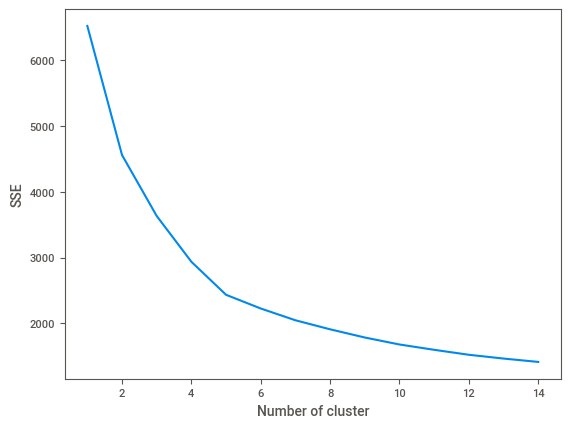

In [22]:
sse = {}
for k in range(1, 15):
    kmeans = KMeans(n_clusters=k, max_iter=1000, n_init = 10).fit(principalDf)
    sse[k] = kmeans.inertia_ # Inertia: Sum of distances of samples to their closest cluster center
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of cluster")
plt.ylabel("SSE")
plt.show()

However, it was hard to find the elbow point of the curve, so i decided to use silhouette score. The silhouette method can calculate the silhouette coefficient and easily find the exact number of K.

### Silhouette Score
Silhouette Coefficient:
Silhouette Coefficient or silhouette score is a metric used to calculate the goodness of a clustering technique. Its value ranges from -1 to 1.

1: Means clusters are well apart from each other and clearly distinguished.

0: Means clusters are indifferent, or we can say that the distance between clusters is not significant.

-1: Means clusters are assigned in the wrong way.


---


**Silhouette Score = (b-a)/max(a,b)**

[More Here](https://towardsdatascience.com/silhouette-coefficient-validating-clustering-techniques-e976bb81d10c#:~:text=Silhouette%20Coefficient%20or%20silhouette%20score%20is%20a%20metric%20used%20to,each%20other%20and%20clearly%20distinguished.)

![picture](https://miro.medium.com/max/1400/1*cUcY9jSBHFMqCmX-fp8BvQ.webp)


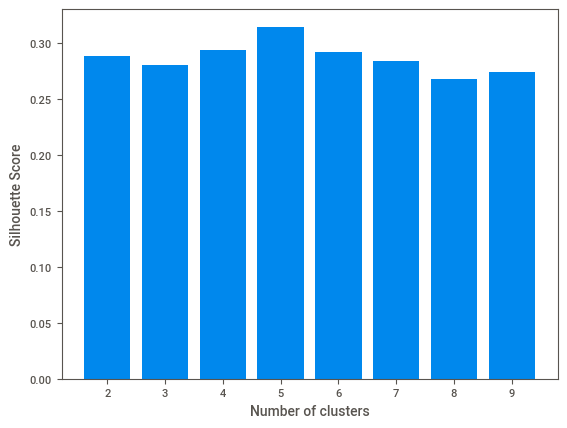

In [23]:
silhouette_scores = []

for n_cluster in range(2, 10):
    silhouette_scores.append(
        silhouette_score(principalDf, KMeans(n_clusters = n_cluster, n_init = 10).fit_predict(principalDf)))

# Plotting a bar graph to compare the results
k = [2, 3, 4, 5, 6,7, 8, 9]
plt.bar(k, silhouette_scores)
plt.xlabel('Number of clusters', fontsize = 10)
plt.ylabel('Silhouette Score', fontsize = 10)
plt.show()

After evaluating the silhouette score for different values of k, it was determined that the highest score was obtained when k=5, indicating that the optimal number of clusters for this dataset is 5.

Subsequently, the KMeans model was configured with k=5 to **partition the data into 5 distinct clusters.**

In [24]:
kmean= KMeans(n_clusters = 5, max_iter = 300, n_init = 10, random_state = 0)
kmean.fit(scaled_df)
labels=kmean.labels_

###Visualization and Interpretation of K-Means Clustering Results

In [25]:
finalDf = pd.concat([principalDf, pd.DataFrame({'cluster':labels})], axis = 1)
finalDf.head()

,p1,p2,p3,p4,p5,cluster
0,-0.495024,-0.667442,-0.007877,0.134300,-0.001921,2
1,-0.469206,0.592943,0.076501,-0.265366,-0.248332,0
2,0.326500,0.192053,0.363387,0.625509,0.081885,1
3,-0.376815,-0.063038,0.584368,0.140949,-0.330734,2
4,-0.564742,-0.488589,-0.065158,0.381325,0.016771,2


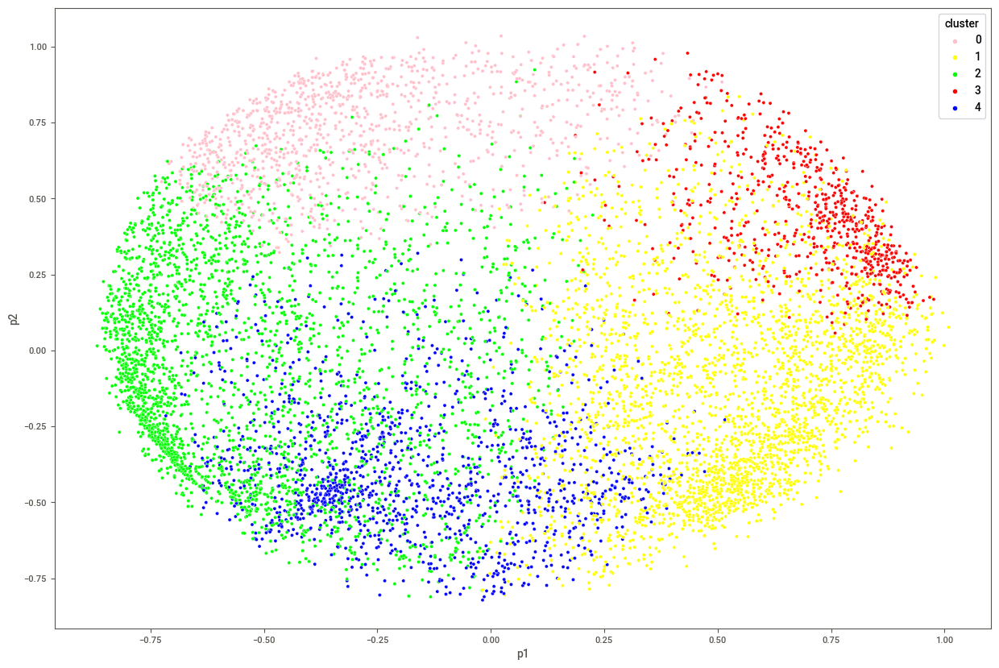

In [26]:
plt.figure(figsize=(15,10))
ax = sns.scatterplot(x="p1", y="p2", hue="cluster", data=finalDf,palette=['pink','yellow','lime', 'red', 'blue'])
plt.show()

In [27]:
# 3d scatterplot using plotly
Scene = dict(xaxis = dict(title  = 'BALANCE'),yaxis = dict(title  = 'ONEOFF_PURCHASES'),zaxis = dict(title  = 'CASH_ADVANCE_TRX'))

# model.labels_ is nothing but the predicted clusters i.e y_clusters
labels = finalDf.cluster
trace = go.Scatter3d(x=finalDf['p4'], y=finalDf['p1'], z=finalDf['p3'], mode='markers',marker=dict(color = labels, size= 10, line=dict(color= 'black',width = 10)))
layout = go.Layout(margin=dict(l=0,r=0),scene = Scene,height = 800,width = 800)
data = [trace]
fig = go.Figure(data = data, layout = layout)
fig.show()

In [28]:
#This metric measures the score of an unspervised ML.
from sklearn.metrics import silhouette_score
score = silhouette_score(finalDf, labels, metric='euclidean',random_state=96)
print("The Silhouette score for KMeans clustering is:  ", score)

The Silhouette score for KMeans clustering is:   0.5434471355165477


The silhouette score of 0.47 suggests that the KMeans algorithm has generated moderate quality clusters, with some degree of separation between the clusters.

###Interpretation of Clustering Results on Real-World Data

In [29]:
clusters=pd.concat([df, pd.DataFrame({'cluster':labels})], axis=1)
clusters.head(10)

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,cluster
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0.0,2.0,1000.0,201.802084,139.509787,0.000000,12.0,2
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4.0,0.0,7000.0,4103.032597,1072.340217,0.222222,12.0,0
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0.0,12.0,7500.0,622.066742,627.284787,0.000000,12.0,1
3,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1.0,1.0,7500.0,0.000000,436.038012,0.000000,12.0,2
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0.0,1.0,1200.0,678.334763,244.791237,0.000000,12.0,2
5,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.000000,0.0,8.0,1800.0,1400.057770,2407.246035,0.000000,12.0,1
6,627.260806,1.000000,7091.01,6402.63,688.38,0.000000,1.000000,1.000000,1.000000,0.000000,0.0,64.0,13500.0,6354.314328,198.065894,1.000000,12.0,3
7,1823.652743,1.000000,436.20,0.00,436.20,0.000000,1.000000,0.000000,1.000000,0.000000,0.0,12.0,2300.0,679.065082,532.033990,0.000000,12.0,1
8,1014.926473,1.000000,861.49,661.49,200.00,0.000000,0.333333,0.083333,0.250000,0.000000,0.0,5.0,7000.0,688.278568,311.963409,0.000000,12.0,2
9,152.225975,0.545455,1281.60,1281.60,0.00,0.000000,0.166667,0.166667,0.000000,0.000000,0.0,3.0,11000.0,1164.770591,100.302262,0.000000,12.0,4


In [30]:
clusters['cluster'].value_counts()

1    2913
2    2896
4    1347
0    1102
3     692
Name: cluster, dtype: int64

In [32]:
clusters.groupby('cluster').mean()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
cluster,,,,,,,,,,,,,,,,,
0,4537.105520,0.963224,478.610191,303.797557,172.828530,4431.258536,0.290498,0.138233,0.185014,0.480195,13.459165,7.284492,7632.036793,3387.460334,1737.303163,0.035796,11.394737
1,828.856834,0.959861,1087.039420,465.500923,621.682517,191.299963,0.887342,0.273308,0.718412,0.040726,0.747683,20.721432,3954.760547,1183.156323,573.237874,0.264769,11.586337
2,1474.971252,0.966848,243.193425,199.812990,43.654492,726.855257,0.157785,0.092638,0.064400,0.155751,2.861533,2.848757,3173.175645,913.277362,712.470269,0.020971,11.517956
3,2836.323952,0.982953,5123.839812,3271.944783,1655.803241,602.775997,0.940149,0.715354,0.745886,0.074825,1.874277,64.046040,8639.739884,5183.416975,1270.348132,0.282052,11.907514
4,106.729669,0.386863,323.156719,198.950238,124.426823,307.271854,0.279251,0.074397,0.194831,0.036232,0.717149,4.228656,3672.338118,1002.985013,258.412455,0.229483,11.266518



**cluster 0** : Their balance is low and don’t do purchases. They only buy the necessities and don’t take the cash advance  to do so. They are a lot in number and aren't giving much profits. Come up with the schemes that make them comfortable to make purchases in installments and by taking cash advances.

**cluster 1** : They are rich people with a lot of balance but not frequent buyers. Even with a lot of balance they still take a lot of cash advance to purchase suggesting that they buy expensive items. They are  a few in quantity. In order to make them shell their money we need to provide them schemes for expensive items as well as the ordinary ones which they are not buying using the credit card. If through the schemes they can spend money on that as well then, they have the capacity to bring a lot of profit.

**cluster 2** : Customers of cluster 2 have a  good credit limit and balance but these customers have a very low one-off purchase and purchases in comparison to cash advance. This means they take more cash advance and spend less through purchasing. They are a lot in number and they should be given schemes accordingly to increase their purchase

**cluster 3**: Customers of cluster 3 have a prety good credit limit and balance and these customers have a very high oneoff purchase and purchases .they are just 85. you should have more customers like them .

**cluster 4**: These  customers  do a lot of purchases. They take minimal cash advance and installments to do purchases. They even have a good balance and can afford their buy. Make sure not to lose them.






#Agglomerative Hierarchical Clustering

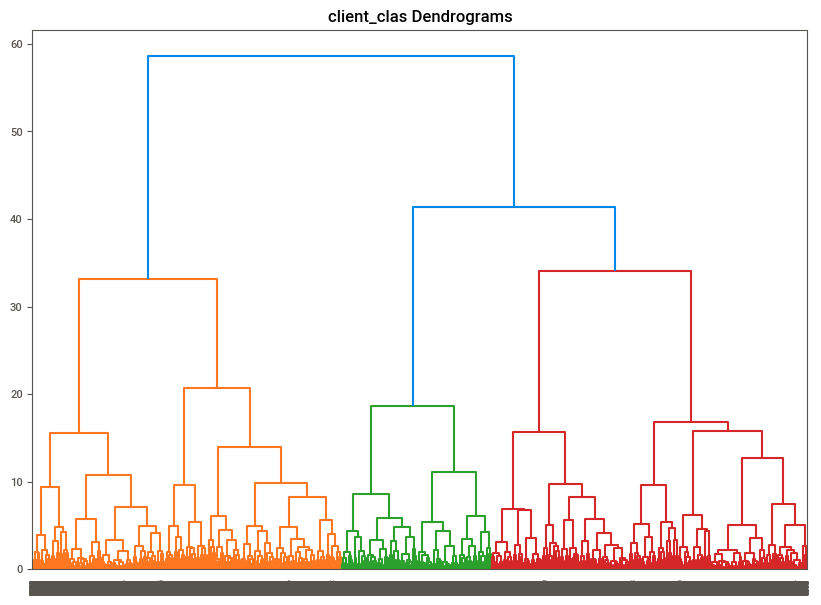

In [33]:
plt.figure(figsize=(10,7))
plt.title("client_clas Dendrograms")
dend=shc.dendrogram(shc.linkage(principalDf, method="ward"))

In [34]:
model=AgglomerativeClustering(n_clusters=2, linkage='ward')
clust_labels= model.fit_predict(principalDf)  #Applying agglomerative algorithm with 2 clusters

In [35]:
agglomerative=pd.DataFrame(clust_labels)
agglomerative.value_counts()

0    5378
1    3572
dtype: int64

In [36]:
#This metric measures the score of an unspervised ML.
from sklearn.metrics import silhouette_score
score = silhouette_score(principalDf, clust_labels, metric='euclidean',random_state=96)
print("The Silhouette score for Hierachical clustering is:  ", score)

The Silhouette score for Hierachical clustering is:   0.2564275473050007


In [37]:

# Define the scene and trace
Scene = dict(xaxis=dict(title='BALANCE'), yaxis=dict(title='PURCHASES'), zaxis=dict(title='CASH_ADVANCE_TRX'))
labels = clust_labels
trace = go.Scatter3d(x=principalDf['p1'], y=principalDf['p2'], z=principalDf['p3'], mode='markers',
                     marker=dict(color=['blue' if label == 0 else 'red' for label in labels], size=10, line=dict(color='black', width=10)))

# Define the layout and show the figure
layout = go.Layout(margin=dict(l=0, r=0), scene=Scene, height=800, width=800)
data = [trace]
fig = go.Figure(data=data, layout=layout)
fig.show()


#Conclusion

In conclusion, our unsupervised machine learning project utilized PCA, KMeans clustering, and hierarchical clustering algorithms to analyze real-world customer data. The results showed that the KMeans algorithm produced a more significant partition of the data into distinct clusters, compared to the hierarchical clustering approach.

Specifically, the KMeans model generated a moderate silhouette score of 0.47, indicating the presence of five types of customers in the data.

The identified customer types can be categorized based on their buying behavior, balance, and use of cash advances. The five types are:
*   (1) Price-sensitive essential-only buyers with low balance
*   (2) High-balance infrequent buyers who use cash advances for expensive items
*   (3) Good balance primarily cash advance customers
*   (4) High-value customers who make profitable purchases but are a small group
*   (5) Frequent buyers with good balance and minimal cash advances

Based on our findings, we recommend that businesses adopt the KMeans clustering algorithm for customer segmentation and tailor their marketing strategies according to the identified customer types. For instance, businesses can offer schemes for installments and cash advances to (1) customers, encourage purchases and reduce reliance on cash advances for (3) customers, and retain (5) customers with good customer service and positive experience.

Overall, the use of unsupervised machine learning techniques can provide valuable insights for businesses to optimize their marketing strategies and enhance customer satisfaction.